In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#import scipy.stats as st
import squidpy as sq
import scanpy as sc
import os

In [2]:
def map_of_reads(reads,key='leiden',size=8,background='white',figuresize=(10,7),save=None,format='pdf',sample='SAMPLE'):
    
    #PARAMETERS TO MODIFY:
    #-key: the terms in adata.obs that you want to plot
    #-clusters:'all' for plotting all clusters in a single plot, 'individual': for plots of individual genes, or ['3','5'] (your groups
    #          between square brackets to plot only some clusters
    #-size: to change the size of your spots
    #-background: to change the color of the background
    #-figuresize: to specify the size of your figure
    #-save: if you want to save your figure, give the PATH of the folder where you want to save it
    #-format: specify the format in which you want to save your figure
    
#    try:
#        adata.obs[key]=adata.obs[key].astype(int)
#        colors=dict(zip(np.unique(adata.obs[key]),adata.uns[key+'_colors']))
#    except:
    #colors=dict(zip(np.unique(adata.obs[key]),adata.uns[key+'_colors']))
    #cl.apply(lambda x: colors[x])
    plt.rcParams['figure.facecolor'] = background
    #cl=adata.obs[key]
#        plt.figure(figsize=figuresize)
    figa=plt.scatter(x=reads.x,y=reads.y,c=reads.color,s=size,linewidths=0, edgecolors=None)
    plt.axis('off')
    if not save==None:
        plt.savefig(save +'map_all_clusters_'+str(size)+'_'+str(sample)+'_'+background+'_'+key+'.'+format,dpi=800)


# start with code

#adata=sc.read('/mnt/f/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_adata4_211123_with_colors.h5ad')

In [3]:
adata=sc.read('/mnt/f/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_adata4_211123_with_colors_&refined.h5ad')

/home/sergioms/.local/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [4]:
dicreg={'LNG1':'Parenchyma','LNG2':'Trachea','LNG3':'Bronchi','LNG5':'Parenchyma','LNG6':'Parenchyma'}
adata.obs['position']=adata.obs['region'].map(dicreg)

In [5]:
col=pd.read_csv('/mnt/f/ISS/annotations_dicts/colors_celltype_annotated_general.csv',sep=';')
dictio=dict(zip(col['celltype_annotated_general'].astype(str),col['colors']))
dictio['SMG intermediate']='blue'

In [6]:
#adata.write('/mnt/d/ISS/adata_baysor/adata_16samples_clustered_log_annotated_curated_notln_adata4_180123_allcts_withcolors.h5ad')

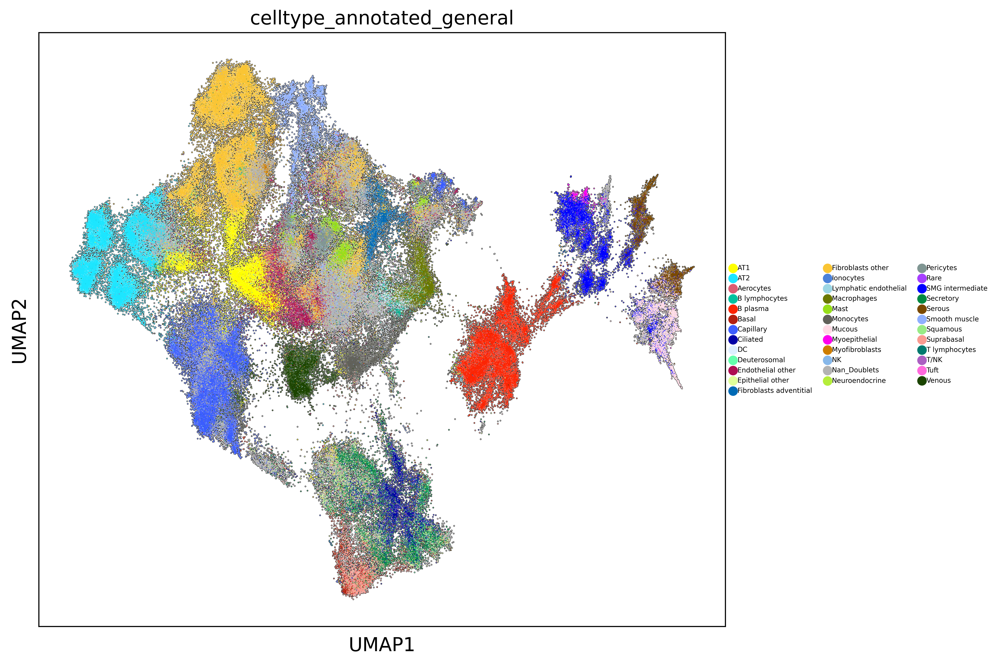

In [7]:
sc.settings.set_figure_params(transparent=True)
sc.set_figure_params(figsize=(9,8),dpi=300)
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

sc.pl.umap(adata,color='celltype_annotated_general',size=2,add_outline=True,legend_fontsize=5,legend_fontoutline=0.8,legend_fontweight='semibold',save='annotated_clusters_celltype_annotated_general.pdf')#,save='annotated_clusters_celltype_annotated_refined.pdf')

In [8]:
multiplication_factors=[1.2,4,2,4,1.2,2,1.2,2,2,2,1,]

# Plotting_all_clusters_DAPI_level2

In [9]:
list(adata.obs['sample'].unique())

['583B_LNG2',
 '583B_LNG3',
 '583B_LNG5',
 '588B1_LNG3',
 '588B2_LNG1',
 '588B_LNG2',
 '588B_LNG6',
 '640C_LNG2',
 '640C_LNG3',
 '640C_LNG5',
 '689C_LNG1',
 '689C_LNG2',
 '689C_LNG3',
 '689C_LNG5']

In [ ]:
num=0
for SAMPLE in adata.obs['sample'].unique()[3:]:
    print(SAMPLE)
    adatasub=adata[adata.obs['sample']==SAMPLE]
    adatasub.obs['X']=adatasub.obs['x']
    adatasub.obs['Y']=adatasub.obs['y']
    adatasub.obs['annotation_3']=adatasub.obs['celltype_annotated_refined'].astype(str)
    adatasub=adatasub[~adatasub.obs['annotation_3'].isin(['not_assigned'])]
    adatasub.uns['celltype_annotated_general_colors']=[dictio[s] for s in  np.unique(adatasub.obs['celltype_annotated_general'])]
    import imageio as iio
    IM=iio.imread('/mnt/f/ISS/DAPI/'+SAMPLE+'_DAPI.tif')
    ax=sc.pl.umap(adata,show=False,s=10)
    sc.pl.umap(adatasub,color='celltype_annotated_general',ax=ax,add_outline=True,save=SAMPLE+'.pdf')
    readsub=pd.read_csv('/mnt/f/ISS/Baysor_segmentation/'+SAMPLE+'.csv')
    rtct=dict(zip(adatasub.obs['cell'].astype(int),adatasub.obs['celltype_annotated_general']))
    readsub['color']=list(readsub['cell'].map(rtct).map(dictio))
    plt.figure(figsize=(10,10))
    plt.imshow(IM*multiplication_factors[num],cmap='gray')
    readsub=readsub[readsub['cell']!=0]
    readsub=readsub[~readsub.cell.map(rtct).isna()]
    map_of_reads(readsub,size=0.08,background='white',figuresize=(10,7),save='/mnt/f/ISS',format='png',sample=SAMPLE)
    #map_of_clusters(adatasub,figuresize=(10,10),size=1,clusters='all',key='celltype_annotated_general')#,save='/mnt/d/ISS')
    plt.show()
    num=0+1

# Plotting_subclusters_DAPI_level3

In [15]:
dictio_refined=dict(zip(np.unique(adata.obs['celltype_annotated_refined']),adata.uns['celltype_annotated_refined_colors']))

In [ ]:
num=0
for SAMPLE in adata.obs['sample'].unique():
    print(SAMPLE)
    adatasub=adata[adata.obs['sample']==SAMPLE]
    adatasub.obs['X']=adatasub.obs['x']
    adatasub.obs['Y']=adatasub.obs['y']
    adatasub.obs['annotation_3']=adatasub.obs['celltype_annotated_refined'].astype(str)
    adatasub=adatasub[~adatasub.obs['annotation_3'].isin(['not_assigned'])]
    adatasub.uns['celltype_annotated_general_colors']=[dictio[s] for s in  np.unique(adatasub.obs['celltype_annotated_general'])]
    ax=sc.pl.umap(adata,show=False,s=10)
    sc.pl.umap(adatasub,color='celltype_annotated_refined',ax=ax,add_outline=True,save=SAMPLE+'.pdf')
    readsub=pd.read_csv('/mnt/f/ISS/Baysor_segmentation/'+SAMPLE+'.csv')
    rtct=dict(zip(adatasub.obs['cell'].astype(int),adatasub.obs['celltype_annotated_general']))
    rtct_refined=dict(zip(adatasub.obs['cell'].astype(int),adatasub.obs['celltype_annotated_refined']))
    #readsub['color']=list(readsub['cell'].map(rtct).map(dictio))
    readsub['level2']=list(readsub['cell'].map(rtct))
    readsub['color']=list(readsub['cell'].map(rtct_refined).map(dictio_refined))
    import imageio as iio
    IM=iio.imread('/mnt/f/ISS/DAPI/'+SAMPLE+'_DAPI.tif')
    readsub=readsub[readsub['cell']!=0]
    readsub=readsub[~readsub.cell.map(rtct).isna()]
    for ctg in readsub['level2'].unique():
        print('Subtype '+ctg)
        readsubsub=readsub.loc[readsub['level2']==ctg,:]
        plt.figure(figsize=(6,6))
        plt.imshow(IM*multiplication_factors[num],cmap='gray')
        map_of_reads(readsubsub,size=0.08,background='white',figuresize=(6,6),save='/mnt/f/ISS/'+ctg,format='png',sample=SAMPLE)
        #map_of_clusters(adatasub,figuresize=(10,10),size=1,clusters='all',key='celltype_annotated_general')#,save='/mnt/d/ISS')
        plt.show()
    num=0+1

In [ ]:
sc.settings.set_figure_params(transparent=True)
sc.set_figure_params(figsize=(9,8),dpi=200,dpi_save=200)
for SAMPLE in adata.obs['sample'].unique()[2:]:
    print(SAMPLE)
    adatasub=adata[adata.obs['sample']==SAMPLE]
    adatasub.obs['X']=adatasub.obs['x']
    adatasub.obs['Y']=adatasub.obs['y']
    adatasub.obs['annotation_3']=adatasub.obs['celltype_annotated_refined'].astype(str)
    adatasub=adatasub[~adatasub.obs['annotation_3'].isin(['not_assigned'])]
    adatasub.uns['celltype_annotated_general_colors']=[dictio[s] for s in  np.unique(adatasub.obs['celltype_annotated_general'])]
    import imageio as iio
    IM=iio.imread('/mnt/f/ISS/HnE/aligned/'+SAMPLE+'.tif')
    ax=sc.pl.umap(adata,show=False,s=10)
    sc.pl.umap(adatasub,color='celltype_annotated_general',ax=ax,add_outline=True,save=SAMPLE+'.pdf')
    readsub=pd.read_csv('/mnt/f/ISS/Baysor_segmentation/'+SAMPLE+'.csv')
    rtct=dict(zip(adatasub.obs['cell'].astype(int),adatasub.obs['celltype_annotated_general']))
    readsub['color']=list(readsub['cell'].map(rtct).map(dictio))
    plt.figure(figsize=(10,10))
    plt.imshow(IM)#,cmap='gray')
    readsub=readsub[readsub['cell']!=0]
    readsub=readsub[~readsub.cell.map(rtct).isna()]
    map_of_reads(readsub,size=0.08,background='white',figuresize=(10,7),save='/mnt/d/ISS/H&E_',format='png',sample=SAMPLE)
    #map_of_clusters(adatasub,figuresize=(10,10),size=1,clusters='all',key='celltype_annotated_general')#,save='/mnt/d/ISS')
    plt.show()

In [98]:
sc.pl.umap(adatasub,color='celltype_annotated_general',ax=ax,add_outline=True,save='_'+SAMPLE+'.pdf')

<Figure size 2700x2400 with 0 Axes>

In [102]:
list(adata.obs['sample'].unique())


['583B_LNG2',
 '583B_LNG3',
 '583B_LNG5',
 '588B1_LNG3',
 '588B2_LNG1',
 '588B_LNG2',
 '588B_LNG6',
 '640C_LNG2',
 '640C_LNG3',
 '640C_LNG5',
 '689C_LNG1',
 '689C_LNG2',
 '689C_LNG3',
 '689C_LNG5']

# Level 1 plots

In [123]:
colors = ['#c1e65c','#21b062','#eb4664','#5c83e6','#63bbdb','#f2ce6b','#63db6d']# (Brown)
adata.uns['cell_class_colors']=colors

In [133]:
np.sum(adatasub.obs['cell_class'].isna())

559

In [128]:
np.unique(adatasub.obs['cell_class'])

TypeError: '<' not supported between instances of 'float' and 'str'

In [ ]:
dictio2=dict(zip(np.unique(list(adata.obs['cell_class']))[0:6],colors))
for SAMPLE in adata.obs['sample'].unique():
    print(SAMPLE)
    adatasub=adata[adata.obs['sample']==SAMPLE]
    adatasub.obs['X']=adatasub.obs['x']
    adatasub.obs['Y']=adatasub.obs['y']
    adatasub.obs['annotation_1']=adatasub.obs['cell_class'].astype(str)
    adatasub=adatasub[~adatasub.obs['cell_class'].isna()]
    adatasub.uns['cell_class_colors']=[dictio2[s] for s in  np.unique(adatasub.obs['cell_class'])]
    import imageio as iio
    IM=iio.imread('/mnt/d/ISS/DAPI/'+SAMPLE+'_DAPI.tif')
    ax=sc.pl.umap(adata,show=False,s=10)
    sc.pl.umap(adatasub,color='cell_class',ax=ax,add_outline=True,save=SAMPLE+'.pdf')
    readsub=pd.read_csv('/mnt/d/ISS/Baysor_segmentation/'+SAMPLE+'.csv')
    rtct=dict(zip(adatasub.obs['cell'].astype(int),adatasub.obs['cell_class']))
    readsub['color']=list(readsub['cell'].map(rtct).map(dictio2))
    plt.figure(figsize=(10,10))
    plt.imshow(IM,cmap='gray')
    readsub=readsub[readsub['cell']!=0]
    readsub=readsub[~readsub.cell.map(rtct).isna()]
    map_of_reads(readsub,size=0.08,background='white',figuresize=(10,7),save='/mnt/d/ISS_cellclass',format='pdf',sample=SAMPLE)
    #map_of_clusters(adatasub,figuresize=(10,10),size=1,clusters='all',key='celltype_annotated_general')#,save='/mnt/d/ISS')
    plt.show()

In [ ]:
sc.pl.umap(adata,color='cell_class',add_outline=True,save='_cell_class.pdf')
plt.show()

In [ ]:
sc.pl.umap(adata,color='celltype_annotated_general',add_outline=True,save='celltype_annotated_general.pdf')

In [ ]:
sc.pp.log1p(adata)
sc.tl.rank_genes_groups(adata, 'celltype_annotated_general', method='t-test', key_added = "t-test")
sc.pl.rank_genes_groups_dotplot(adata, n_genes=1, key = "t-test",save='celltype_annotated_general_1_marker.pdf')
sc.pl.rank_genes_groups(adata, n_genes=7, key = "t-test",save='deg_celltype_annotated_general.pdf',fontsize=15)

In [ ]:
sc.pp.log1p(adata)
sc.tl.rank_genes_groups(adata, 'cell_class', method='t-test', key_added = "t-test")
sc.pl.rank_genes_groups_dotplot(adata, n_genes=3, key = "t-test",save='cell_class_3_marker.pdf')
sc.pl.rank_genes_groups(adata, n_genes=7,fontsize=15, key = "t-test",save='deg_cell_class_general.pdf')